# Using a pretrained network to train the model
## Instantiating the VGG16 convolutional base

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
from keras.applications import VGG16

conv_base = VGG16(weights='imagenet',
                  include_top=False,
                  input_shape=(150, 150, 3))

58892288/58889256 [==============================] - 0s 0us/step


In [ ]:
import os
import numpy as np
from keras.preprocessing.image import ImageDataGenerator

base_dir = '/content/drive/My Drive/datasets/dog_vs_cat/small_dataset'
train_dir = os.path.join(base_dir, 'train')
validation_dir = os.path.join(base_dir, 'validation')
test_dir = os.path.join(base_dir, 'test')

datagen = ImageDataGenerator(rescale=1./255)
batch_size = 20

def extract_features(directory, sample_count):
    features = np.zeros(shape=(sample_count, 4, 4, 512))
    labels = np.zeros(shape=(sample_count))

    # this gets the dir of the train image and 
    # convert it to binary and also resize all images to 150x150
    generator = datagen.flow_from_directory( directory,
                target_size=(150, 150),
                batch_size=batch_size,
                class_mode='binary')
    i = 0

    # Note the generator yields data indefinitely in a loop,
    # it must be stopped after every imeage has been since once
    for inputs_batch, labels_batch in generator:
        features_batch = conv_base.predict(inputs_batch)
        features[i * batch_size : (i + 1) * batch_size] = features_batch
        labels[i * batch_size : (i + 1) * batch_size] = labels_batch
        i += 1
        if i * batch_size >= sample_count:
            break

    return features, labels

train_features, train_labels = extract_features(train_dir, 2000)
validation_features, validation_labels = extract_features(validation_dir, 1000)
test_features, test_labels = extract_features(test_dir, 1000)


# The extracted features are currently of shape (samples, 4, 4, 512). 
# You’ll feed them to a densely connected classifier, 
# so first you must flatten them to (samples, 8192)
train_features = np.reshape(train_features, (2000, 4 * 4 * 512))
validation_features = np.reshape(validation_features, (1000, 4 * 4 * 512))
test_features = np.reshape(test_features, (1000, 4 * 4 * 512))

Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


## Defining and training the densely connected classifier
At this point, you can define your densely connected classifier (note the use of drop-out for regularization) and train it on the data and labels that you just recorded

In [ ]:
from keras import models
from keras import layers
from keras import optimizers

model = models.Sequential()
model.add(layers.Dense(256, activation='relu', input_dim=4 * 4 * 512))
model.add(layers.Dropout(0.5))
model.add(layers.Dense(1, activation='sigmoid'))

model.compile(optimizer=optimizers.RMSprop(lr=2e-5),
              loss='binary_crossentropy',
              metrics=['acc'])

history = model.fit(train_features, train_labels,
                    epochs=30,
                    batch_size=20,
                    validation_data=(validation_features, validation_labels))


model.save(base_dir + '/cats_and_dogs_small_pretrained_1.h5')

Epoch 1/30
100/100 [==============================] - 1s 5ms/step - loss: 0.6505 - acc: 0.6310 - val_loss: 0.4513 - val_acc: 0.8240
Epoch 2/30
100/100 [==============================] - 0s 4ms/step - loss: 0.4380 - acc: 0.7930 - val_loss: 0.3625 - val_acc: 0.8590
Epoch 3/30
100/100 [==============================] - 0s 4ms/step - loss: 0.3717 - acc: 0.8335 - val_loss: 0.3195 - val_acc: 0.8840
Epoch 4/30
100/100 [==============================] - 0s 4ms/step - loss: 0.3200 - acc: 0.8695 - val_loss: 0.2957 - val_acc: 0.8890
Epoch 5/30
100/100 [==============================] - 0s 4ms/step - loss: 0.2864 - acc: 0.8855 - val_loss: 0.2813 - val_acc: 0.8920
Epoch 6/30
100/100 [==============================] - 0s 4ms/step - loss: 0.2680 - acc: 0.8940 - val_loss: 0.2854 - val_acc: 0.8860
Epoch 7/30
100/100 [==============================] - 0s 4ms/step - loss: 0.2452 - acc: 0.9085 - val_loss: 0.2639 - val_acc: 0.8940
Epoch 8/30
100/100 [==============================] - 0s 4ms/step - loss: 0.

## Plotting the results
The plot indicates that overfitting starts almost from the start, despite using dropout with a fairly large rate. This happen because this technique doesn't use data augmentation, which is essential to prevent overfitting

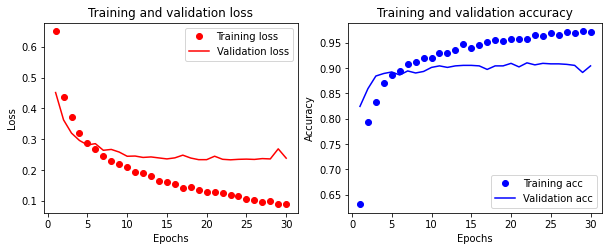

In [ ]:
def plot_history(history):
    import pandas as pd
    import matplotlib.pyplot as plt
    history_dict = history.history
    df = pd.DataFrame(history_dict)

    plt.rcParams['figure.figsize'] = [10, 3.5]
    fig, axs = plt.subplots(1, 2)
    plt.subplots_adjust(hspace=0.5, wspace=0.2)
    p1, p2 = axs[0], axs[1]

    epochs = range(1, len(df.index) + 1)
    p1.plot(epochs, df[df.columns[0]], 'ro', label='Training loss')
    p1.plot(epochs, df[df.columns[2]], 'r', label='Validation loss')
    p1.set_title('Training and validation loss')
    p1.set_xlabel('Epochs')
    p1.set_ylabel('Loss')
    p1.legend()

    p2.plot(epochs, df[df.columns[1]], 'bo', label='Training acc')
    p2.plot(epochs, df[df.columns[3]], 'b', label='Validation acc')
    p2.set_title('Training and validation accuracy')
    p2.set_xlabel('Epochs')
    p2.set_ylabel('Accuracy')
    p2.legend()

    plt.show()

plot_history(history)

## FEATURE EXTRACTION WITH DATA AUGMENTATION
Adding a densely connected classifier on top of the convolutional base

Before you compile and train the model, it’s very important to freeze the convolu- tional base. Freezing a layer or set of layers means preventing their weights from being updated during training.

In [ ]:
import os
import numpy as np
from keras import models
from keras import layers
from keras.preprocessing.image import ImageDataGenerator

base_dir = '/content/drive/My Drive/datasets/dog_vs_cat/small_dataset'
train_dir = os.path.join(base_dir, 'train')
validation_dir = os.path.join(base_dir, 'validation')
test_dir = os.path.join(base_dir, 'test')


model = models.Sequential()
model.add(conv_base)
model.add(layers.Flatten())
model.add(layers.Dense(256, activation='relu'))
model.add(layers.Dense(1, activation='sigmoid'))

conv_base.trainable = False


## Training the model end to end with a frozen convolutional base

In [ ]:
from keras.preprocessing.image import ImageDataGenerator
from keras import optimizers

train_datagen = ImageDataGenerator(
                rescale=1./255,
                rotation_range=40,
                width_shift_range=0.2,
                height_shift_range=0.2,
                shear_range=0.2,
                zoom_range=0.2,
                horizontal_flip=True,
                fill_mode='nearest')

# Validation set should not be argumented
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
                train_dir,                  # target directory
                target_size=(150, 150),     # resize image to 150 x 150
                batch_size=20,
                class_mode='binary')

validation_generator = test_datagen.flow_from_directory(
                validation_dir,
                target_size=(150, 150),
                batch_size=20,
                class_mode='binary')

model.compile(loss='binary_crossentropy',
            optimizer=optimizers.RMSprop(lr=2e-5),
            metrics=['acc'])

history = model.fit_generator(
            train_generator,
            steps_per_epoch=100,
            epochs=30,
            validation_data=validation_generator,
            validation_steps=50)

model.save(base_dir + '/tomatoes_pretrained_2.h5')

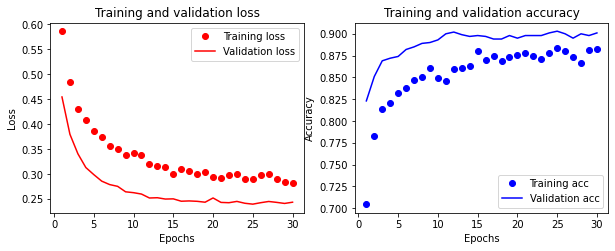

In [ ]:
plot_history(history)

In [1]:
from tensorflow.keras.models import Sequential, save_model, load_model
import numpy as np

filepath = '/home/dit/DiT/GitHub/Pylingo/Jupyters/DS/Keras/saved_model/cats_and_dogs_small_pretrained_2.h5'

model = load_model(
    filepath,
    custom_objects=None,
    compile=True)

In [2]:
import os
import pandas as pd
from keras.preprocessing.image import ImageDataGenerator

IMAGE_SIZE = (150, 150)
batch_size = 15
test_path = "/home/dit/Downloads/Compressed/test1"

test_filenames = os.listdir(test_path)
test_df = pd.DataFrame({'filename': test_filenames})

nb_samples = test_df.shape[0]

test_gen = ImageDataGenerator(rescale=1./255)

test_set = test_gen.flow_from_dataframe(
    test_df, 
    test_path, 
    x_col='filename',
    y_col=None,
    class_mode=None,
    target_size=IMAGE_SIZE,
    batch_size=batch_size,
    shuffle=False)

Found 12500 validated image filenames.


# Predict

For categoral classication the prediction will come with probability of each category. So we will pick the category that have the highest probability with numpy average max


In [3]:
predict = model.predict(test_set, steps=np.ceil(nb_samples/batch_size))

test_df['raw_category'] = predict
test_df['category'] = np.argmax(predict, axis=-1)

test_df.to_csv('predict.csv')

In [14]:
test_df.to_csv('predict.csv', index=False)

In [ ]:
test_df['strongly_right'] = test_df['raw_category'].apply()

In [2]:
import pandas as pd

test_df = pd.read_csv('/home/dit/DiT/GitHub/Pylingo/Jupyters/DS/Keras/saved_model/predict.csv')
test_df.head()

,filename,category,raw_category
0,9857.jpg,0,0.000929
1,8020.jpg,0,0.230757
2,10038.jpg,0,0.669210
3,11189.jpg,0,0.996814
4,3872.jpg,0,0.003723


In [ ]:
fil = (test_df['raw_category'] > 0.4) & (test_df['raw_category'] < 0.6)

test_df[fil]

## Verification
Plotting the weakly predicted result to see why. We have 717 images that are weekly predicted out of 12500

Note: not all 12500 are also correctly predicted and not all the weakly predicted are wrong

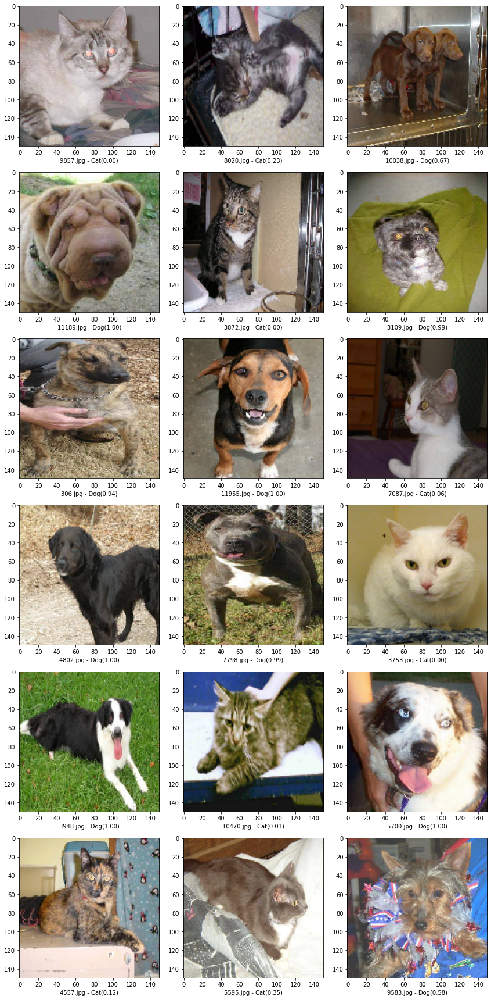

In [22]:
import pandas as pd
import matplotlib.pyplot as plt
from keras.models import load_model
from keras.preprocessing.image import load_img

IMAGE_SIZE = (150, 150)
test_path = "/home/dit/Downloads/Compressed/test1"

df = pd.read_csv('/home/dit/DiT/GitHub/Pylingo/Jupyters/DS/Keras/saved_model/predict.csv')

fil = (df['raw_category'] > 0.4) & (df['raw_category'] < 0.6)
test_df = df

sample_test = test_df.head(18)
sample_test.head()
plt.figure(figsize=(12, 24))

i = 0
for index, row in sample_test.iterrows():
    i += 1

    filename = row['filename']
    category = row['raw_category']

    if category >= 0.5:
        animal = 'Dog'
    else:
        animal = 'Cat'

    # print(index)
    img = load_img(test_path + '/' + filename, target_size=IMAGE_SIZE)
    plt.subplot(6, 3, i)
    plt.imshow(img)
    plt.xlabel(f'{filename} - {animal}' + '(' + "{:.2f}".format(category) + ')' )
plt.tight_layout()
plt.show()

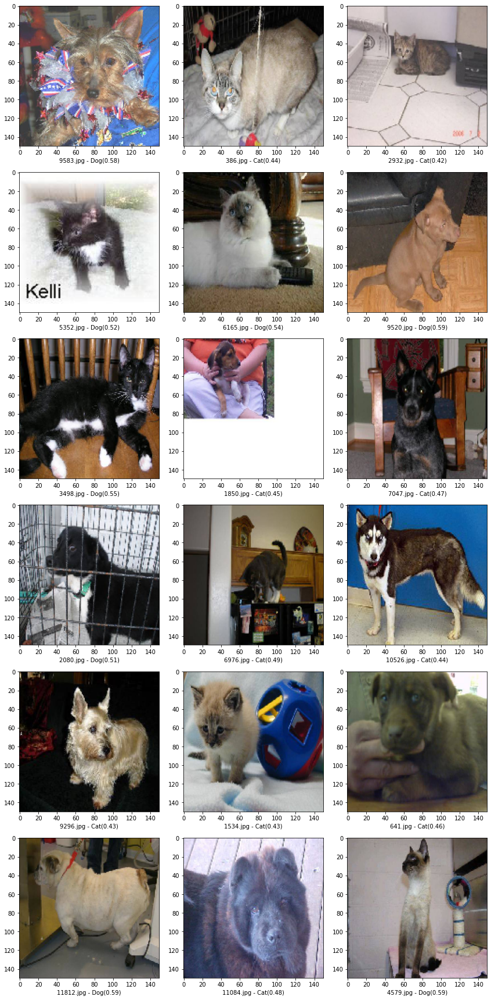

In [17]:
import pandas as pd
import matplotlib.pyplot as plt
from keras.models import load_model
from keras.preprocessing.image import load_img

IMAGE_SIZE = (150, 150)
test_path = "/home/dit/Downloads/Compressed/test1"

df = pd.read_csv('/home/dit/DiT/GitHub/Pylingo/Jupyters/DS/Keras/saved_model/predict.csv')

fil = (df['raw_category'] > 0.4) & (df['raw_category'] < 0.6)
test_df = df[fil]

sample_test = test_df.head(18)
sample_test.head()
plt.figure(figsize=(12, 24))

i = 0
for index, row in sample_test.iterrows():
    i += 1

    filename = row['filename']
    category = row['raw_category']

    if category >= 0.5:
        animal = 'Dog'
    else:
        animal = 'Cat'

    # print(index)
    img = load_img(test_path + '/' + filename, target_size=IMAGE_SIZE)
    plt.subplot(6, 3, i)
    plt.imshow(img)
    plt.xlabel(f'{filename} - {animal}' + '(' + "{:.2f}".format(category) + ')' )
plt.tight_layout()
plt.show()

In [18]:
f = '13413.r'
c = 0.9643

print(f + '(' + "{:.2f}".format(c) + ')' )


13413.r(0.96)


We will convert the predict category back into our generator classes by using train_generator.class_indices. It is the classes that image generator map while converting data into computer vision

In [ ]:
label_map = dict((v,k) for k,v in train_generator.class_indices.items())
test_df['category'] = test_df['category'].replace(label_map)


In [ ]:
test_df['category'].value_counts().plot.bar()


In [11]:
import matplotlib.pyplot as plt
import random

def plot_on_grid(test_set, idx_to_plot, img_size=150):
  fig, ax = plt.subplots(3,3, figsize=(20,10))
  for i, idx in enumerate(random.sample(idx_to_plot,9)):
    img = test_set.__getitem__(idx)[0].reshape(img_size, img_size ,3)
    ax[int(i/3), i%3].imshow(img)
    ax[int(i/3), i%3].axis('off')

## plot strongly predicted right
No surprises there! These are almost classical images of cats and dogs. Notice that the pointy ears of cats and the dark eyes of dogs can all be seen in the preceding images. These characteristic features allow our CNN to easily identify them.

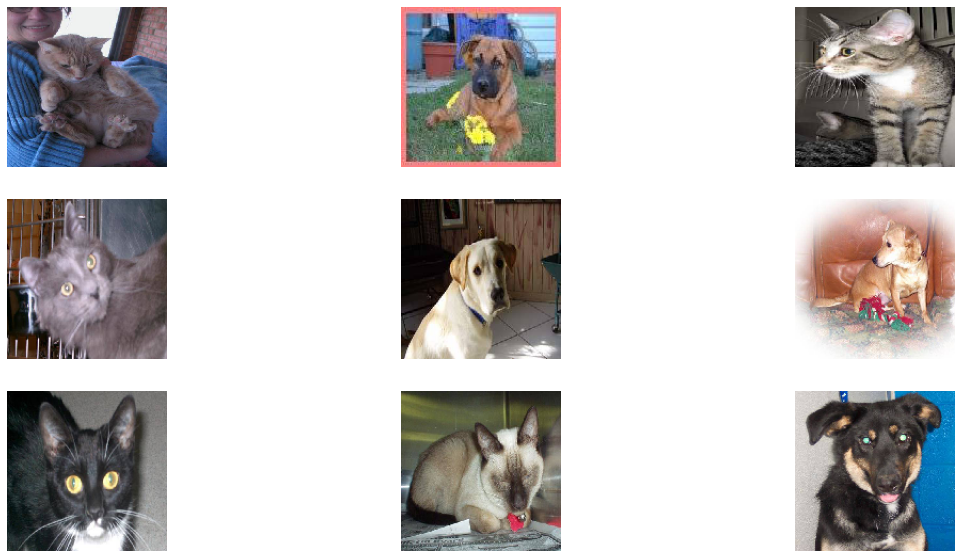

In [12]:
plot_on_grid(test_set, strongly_right_idx)

## plot strongly predicted wrong
We notice a few commonalities among these strongly wrong predictions. The first thing we notice is that certain dogs do resemble cats with their pointy ears. Perhaps our neural network placed too much emphasis on the pointy ears and classified these dogs as cats. Another thing we notice is that some of the subjects were not facing the camera, making it really difficult to identify them. No wonder our neural network got them wrong.

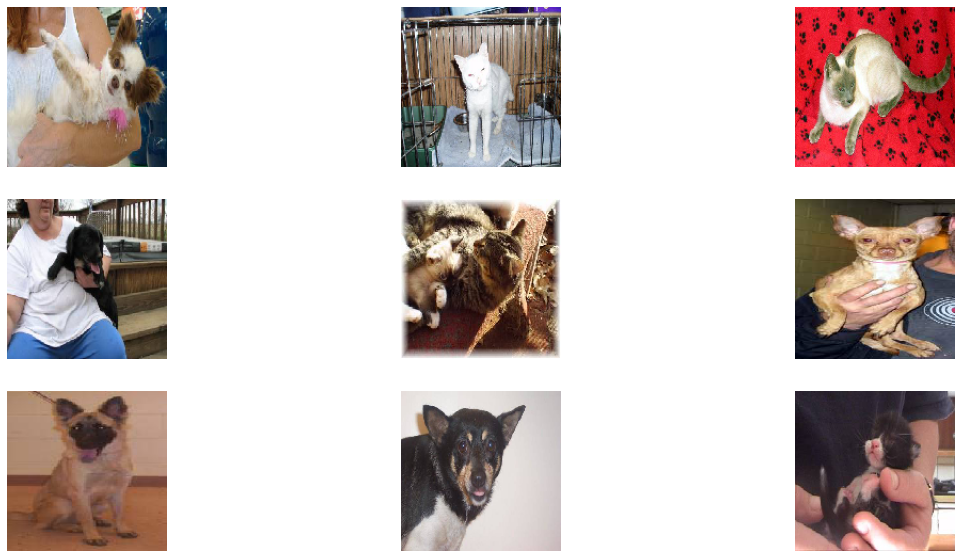

In [13]:
plot_on_grid(test_set, strongly_wrong_idx)

## plot weakly predicted wrong
These images are ones that our model is on the fence with. Perhaps there is an equal number of characteristics to suggest that the object could be a dog or a cat. This is perhaps the most obvious with the images in the first row, where the puppies in the first row have a small frame like a cat, which could have confused the neural network

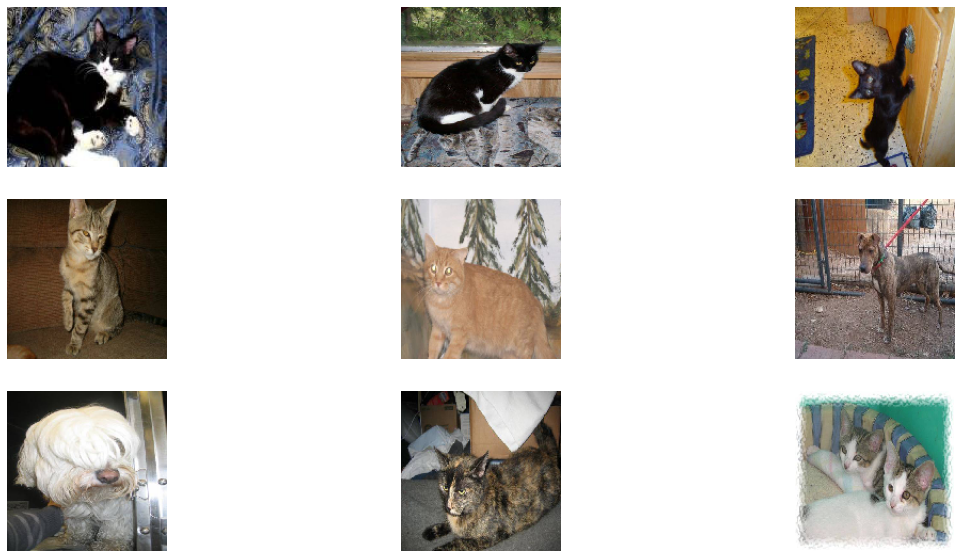

In [15]:
plot_on_grid(test_set, weakly_wrong_idx)